In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras import backend as K
import numpy as np
import cv2
from skimage.morphology import skeletonize
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')  # Suppress annoying warnings

# import smorph as sm
import skimage
import matplotlib.pyplot as plt
import ipywidgets as widgets

## ***Helping Functions***

In [ ]:

def find_petri_dish_thresholding(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    petri_dish_contour = None
    min_contour_area = 4000

    for contour in contours:
        if cv2.contourArea(contour) > min_contour_area:
            petri_dish_contour = contour
            break

    x, y, w, h = cv2.boundingRect(petri_dish_contour)
    side_length = max(w, h)
    x_center, y_center = x + w // 2, y + h // 2

    petri_dish = image[y:y + h, x:x + w]
    petri_dish = cv2.resize(petri_dish, (2670, 2670))
    petri_dish_gray = cv2.cvtColor(petri_dish, cv2.COLOR_BGR2GRAY)

    return petri_dish_gray

def extract_medial_axis(binary_image):
    skeleton = skeletonize(binary_image // 255)
    return skeleton

def measure_and_draw_root_lengths(image, skeleton):
    labeled_skeleton = label(skeleton)
    regions = regionprops(labeled_skeleton)

    primary_root_length = 0
    lateral_root_lengths = []
    drawn_image = image.copy()

    for region in regions:
        coords = region.coords
        length = region.perimeter

        if region.label == 1:
            primary_root_length = length
            for coord in coords:
                cv2.circle(drawn_image, (coord[1], coord[0]), 1, (0, 255, 0), -1)
        else:
            lateral_root_lengths.append(length)
            for coord in coords:
                cv2.circle(drawn_image, (coord[1], coord[0]), 1, (255, 255, 0), -1)

    total_lateral_root_length = sum(lateral_root_lengths)

    return primary_root_length, total_lateral_root_length, drawn_image

## ***-Image1***

Primary Root Length: 748.3036072312182 pixels


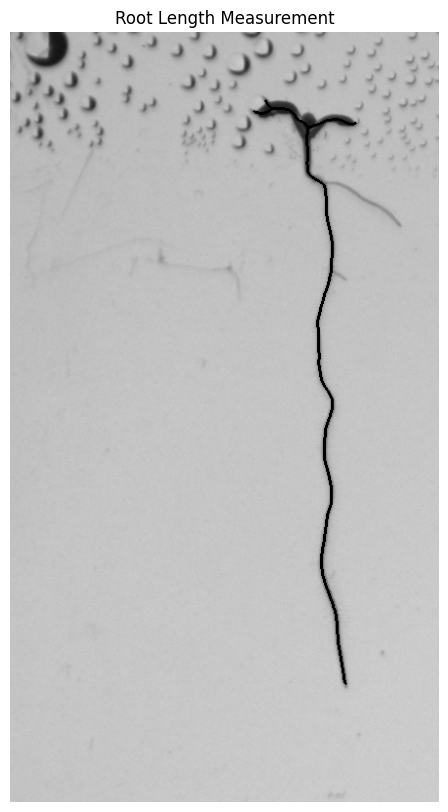

Primary Root Length: 674.8355697996826 pixels


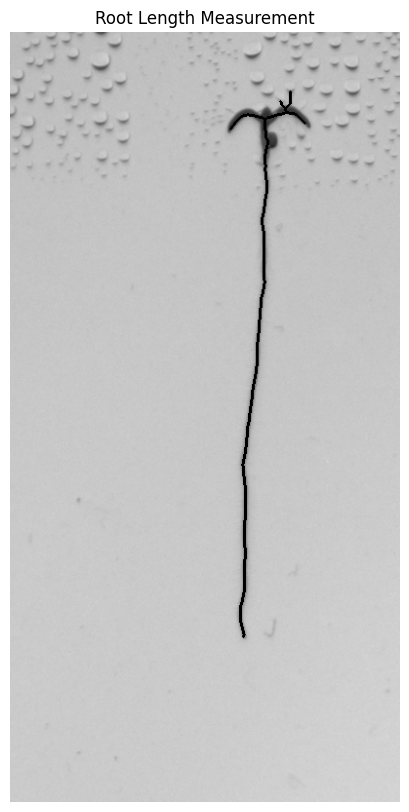

Primary Root Length: 860.0559159102154 pixels


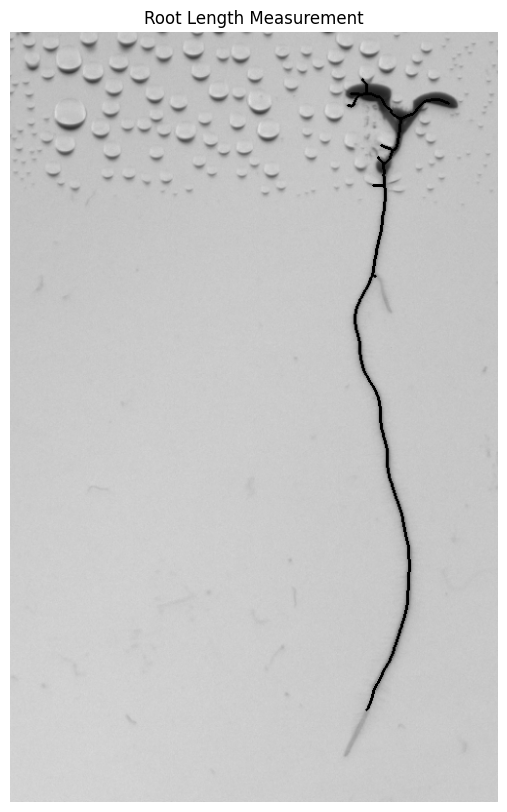

Primary Root Length: 623.936074863071 pixels


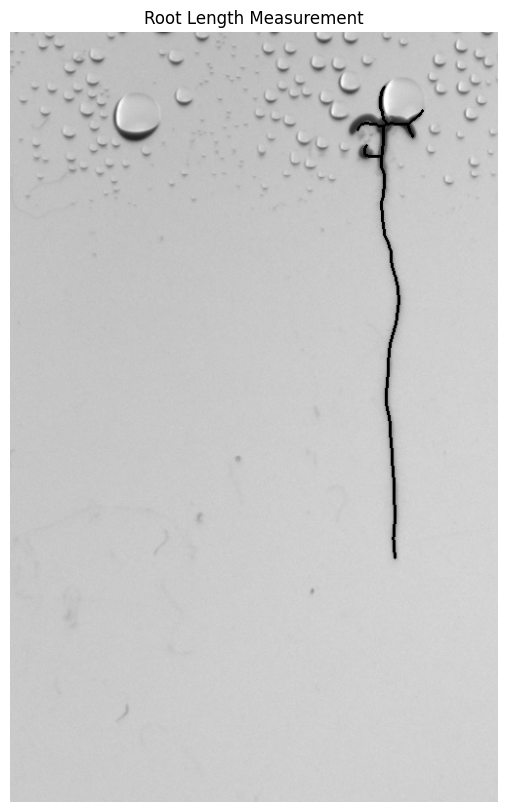

Primary Root Length: 821.9665581351203 pixels


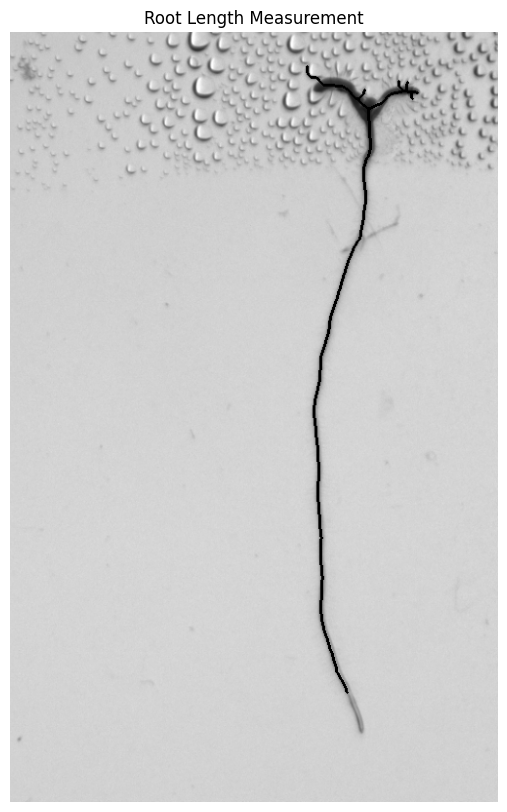

Results saved to root_lengths.csv


In [ ]:
# List to store the results
results = []

# Process each image and save the results
img_1 = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_1.tif')
petri_dish_1 = find_petri_dish_thresholding(img_1)

def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[340:1130, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    skeleton = extract_medial_axis(plants_only)
    primary_length, lateral_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_1_plant_{plant_number}", primary_length_rounded])
    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()

# Process each plant with the specified thresholds
process_plant(petri_dish_1, 60, 500, 150, 1, results)
process_plant(petri_dish_1, 600, 1000, 180, 2, results)
process_plant(petri_dish_1, 1000, 1500, 165, 3, results)
process_plant(petri_dish_1, 1500, 2000, 180, 4, results)
process_plant(petri_dish_1, 2000, 2500, 160, 5, results)

# Write the results to a CSV file
with open('root_lengths.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths.csv")


## ***-Image2***

Primary Root Length: 1625.549385979917 pixels


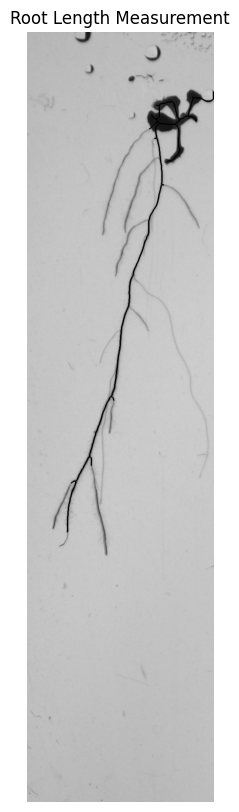

Primary Root Length: 2167.6164491784257 pixels


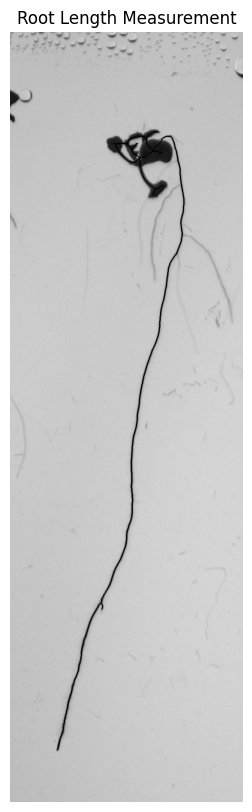

Primary Root Length: 1882.377813104663 pixels


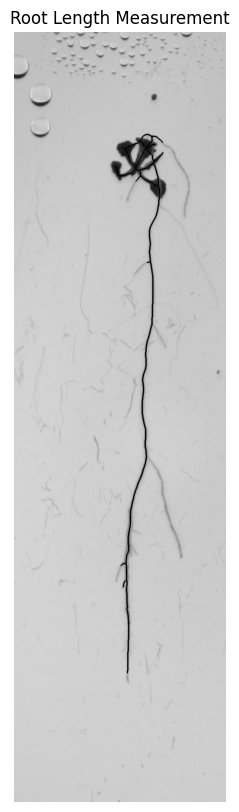

Primary Root Length: 1661.8853890554883 pixels


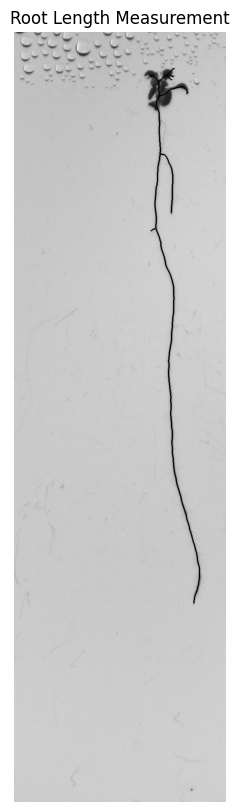

Primary Root Length: 1717.1402230514273 pixels


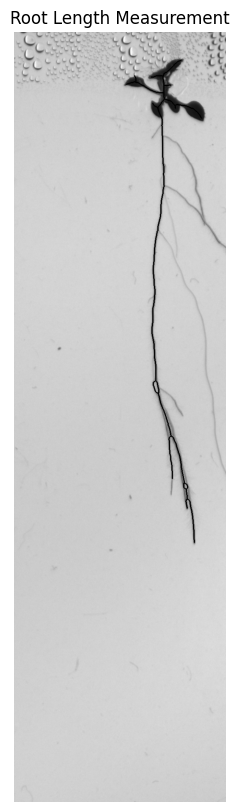

Results saved to root_lengths2.csv


In [ ]:


# List to store the results
results = []

# Process each image and save the results
image = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_2.tif')
petri_dish_2 = find_petri_dish_thresholding(image)

def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:2170, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    skeleton = extract_medial_axis(plants_only)
    primary_length, lateral_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_2_plant_{plant_number}", primary_length_rounded])

    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()
# [350:2170, 50:2600]
# Process each plant with the specified thresholds
process_plant(petri_dish_2, 60, 500, 150, 1, results)
process_plant(petri_dish_2, 450, 1000, 160, 2, results)
process_plant(petri_dish_2, 1000, 1500, 165, 3, results)
process_plant(petri_dish_2, 1500, 2000, 180, 4, results)
process_plant(petri_dish_2, 2000, 2500, 160, 5, results)

# Write the results to a CSV file
with open('root_lengths2.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths2.csv")


## ***-Image3***

Primary Root Length: 1870.9585489084068 pixels


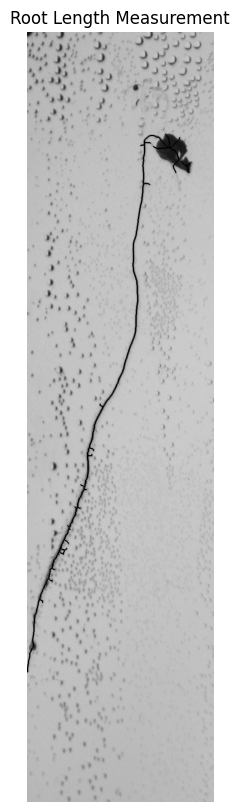

Primary Root Length: 2147.4499269370554 pixels


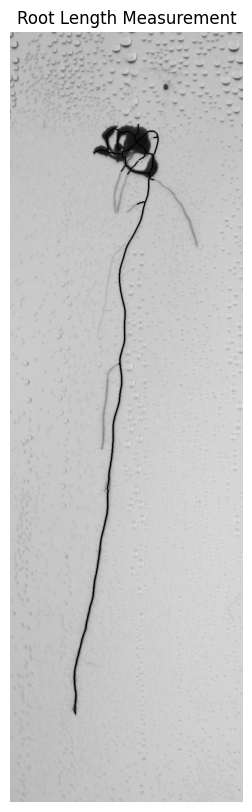

Primary Root Length: 2015.934162290767 pixels


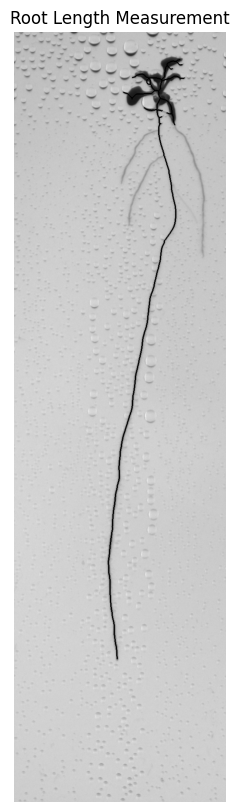

Primary Root Length: 1970.9219689819474 pixels


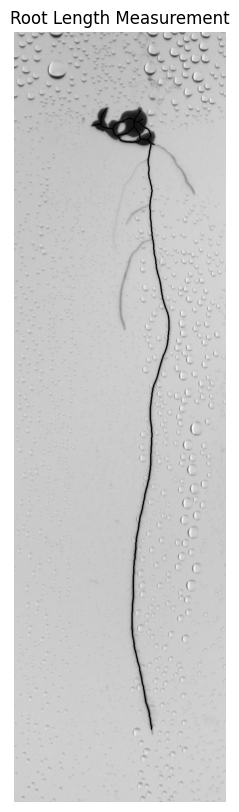

Primary Root Length: 1932.006276123159 pixels


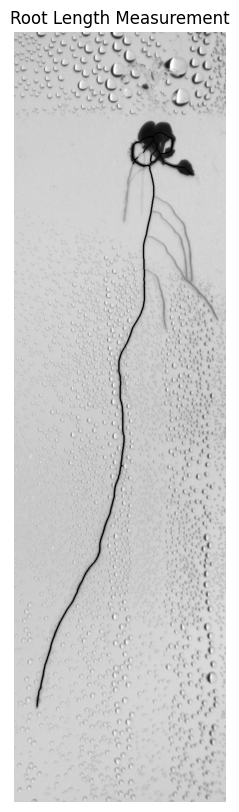

Results saved to root_lengths3.csv


In [ ]:


# List to store the results
results = []

# Process each image and save the results
image = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_3.tif')
petri_dish_3 = find_petri_dish_thresholding(image)

def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:2170, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    skeleton = extract_medial_axis(plants_only)
    primary_length, lateral_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_3_plant_{plant_number}", primary_length_rounded])

    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()
# [350:2170, 50:2600]
# Process each plant with the specified thresholds
process_plant(petri_dish_3, 60, 500, 170, 1, results)
process_plant(petri_dish_3, 450, 1000, 160, 2, results)
process_plant(petri_dish_3, 1000, 1500, 160, 3, results)
process_plant(petri_dish_3, 1500, 2000, 160, 4, results)
process_plant(petri_dish_3, 2000, 2500, 160, 5, results)

# Write the results to a CSV file
with open('root_lengths3.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths3.csv")


## ***Image4***

Primary Root Length: 1298.4234482783627 pixels


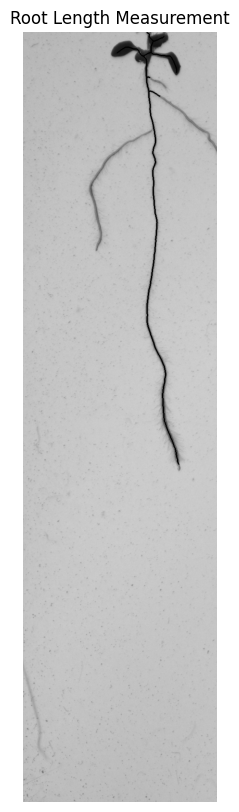

Primary Root Length: 1860.3433252192567 pixels


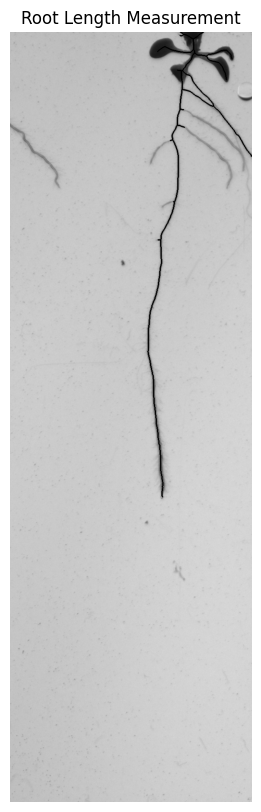

Primary Root Length: 1259.0386719675125 pixels


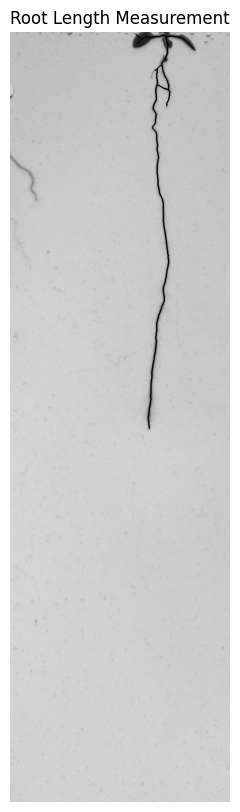

Primary Root Length: 1152.683332908185 pixels


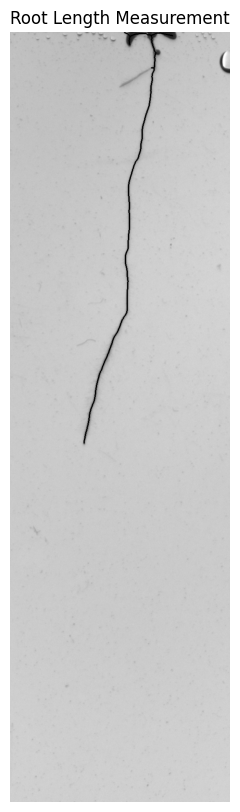

Primary Root Length: 1231.4762261269984 pixels


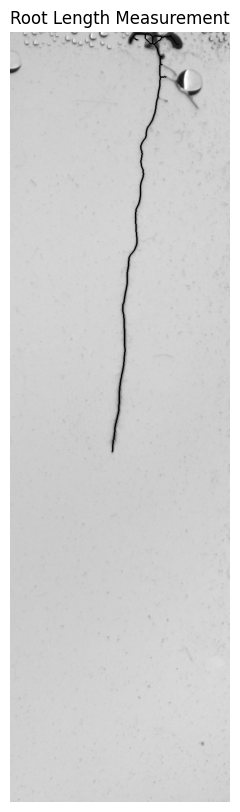

Results saved to root_lengths4.csv


In [ ]:


# List to store the results
results = []

# Process each image and save the results
image = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_4.tif')
petri_dish_4 = find_petri_dish_thresholding(image)

def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:2100, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    skeleton = extract_medial_axis(plants_only)
    primary_length, lateral_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_4_plant_{plant_number}", primary_length_rounded])

    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()
# [350:2170, 50:2600]
# Process each plant with the specified thresholds
process_plant(petri_dish_4, 60, 500, 136, 1, results)
process_plant(petri_dish_4, 450, 1000, 157, 2, results)
process_plant(petri_dish_4, 1000, 1500, 165, 3, results)
process_plant(petri_dish_4, 1500, 2000, 160, 4, results)
process_plant(petri_dish_4, 2000, 2500, 160, 5, results)

# Write the results to a CSV file
with open('root_lengths4.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths4.csv")


## ***Image5***

Primary Root Length: 1776.8864350760148 pixels


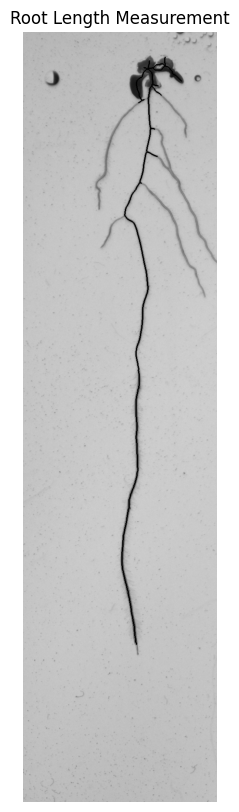

Primary Root Length: 2204.9585489084066 pixels


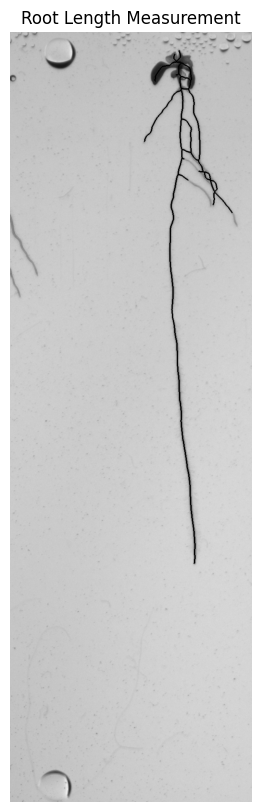

Primary Root Length: 1404.5777772109132 pixels


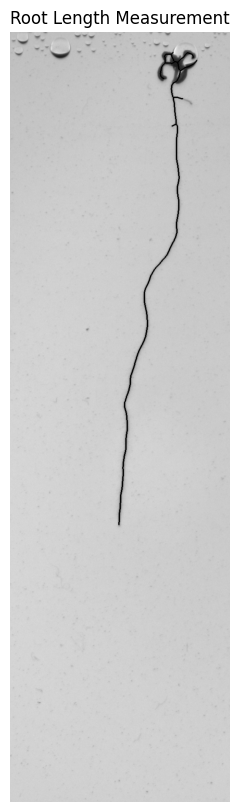

Primary Root Length: 1628.7787873376897 pixels


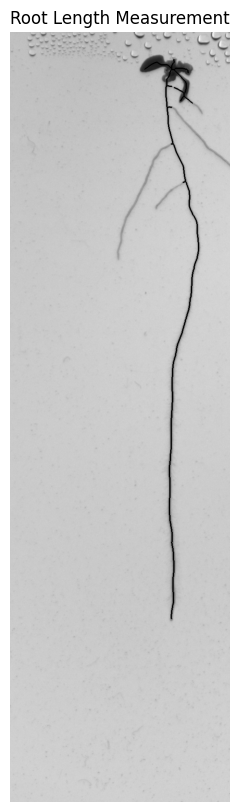

Primary Root Length: 2005.7920266670362 pixels


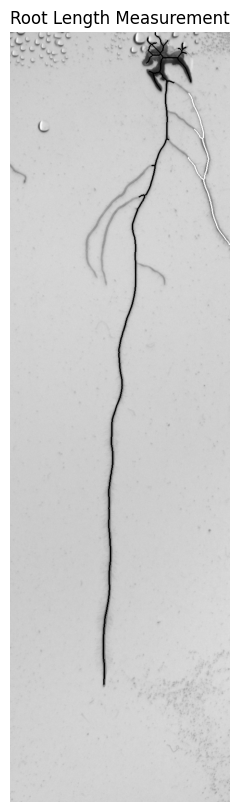

Results saved to root_lengths5.csv


In [ ]:


# List to store the results
results = []

# Process each image and save the results
image = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_5.tif')
petri_dish_5 = find_petri_dish_thresholding(image)

def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:2100, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    skeleton = extract_medial_axis(plants_only)
    primary_length, lateral_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_5_plant_{plant_number}", primary_length_rounded])

    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()
# [350:2170, 50:2600]
# Process each plant with the specified thresholds
process_plant(petri_dish_5, 60, 500, 141, 1, results)
process_plant(petri_dish_5, 450, 1000, 162, 2, results)
process_plant(petri_dish_5, 1000, 1500, 165, 3, results)
process_plant(petri_dish_5, 1500, 2000, 160, 4, results)
process_plant(petri_dish_5, 2000, 2500, 160, 5, results)

# Write the results to a CSV file
with open('root_lengths5.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths5.csv")


## ***Image6***

Primary Root Length: 0 pixels


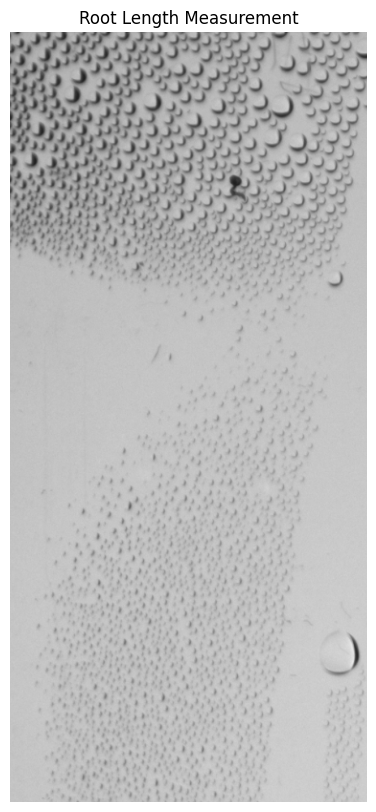

Primary Root Length: 0 pixels


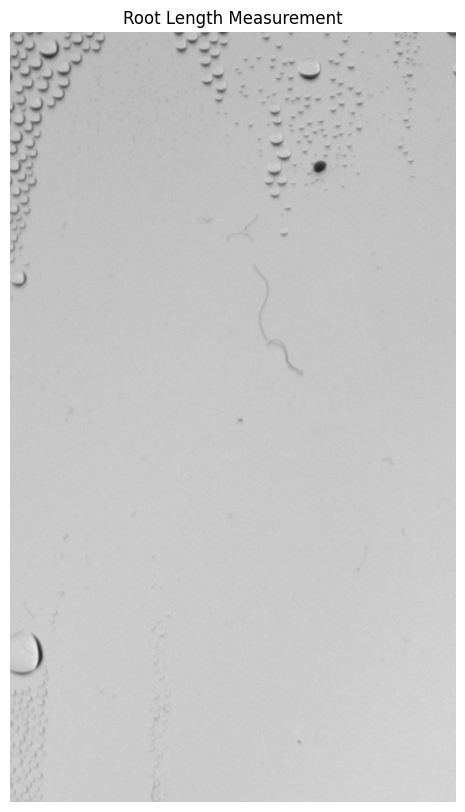

Primary Root Length: 0 pixels


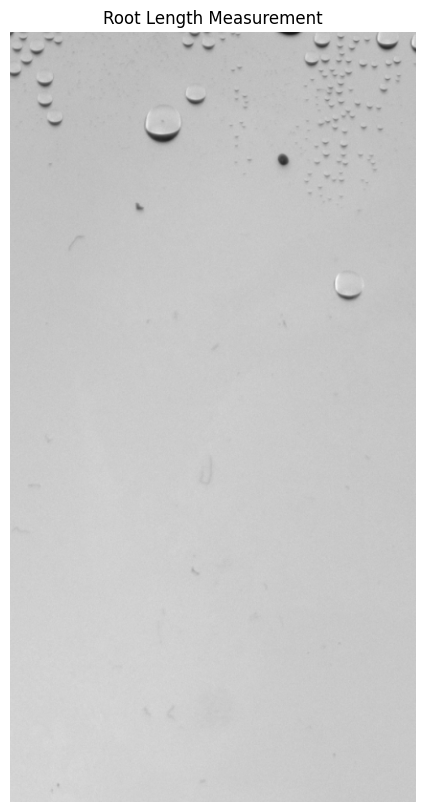

Primary Root Length: 0 pixels


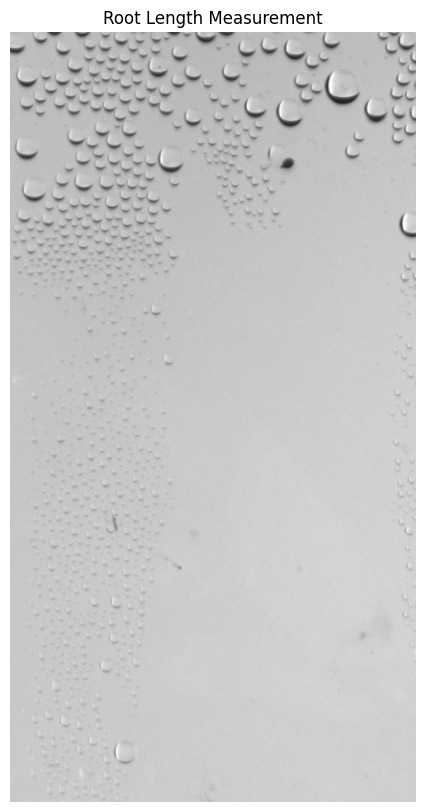

Primary Root Length: 0 pixels


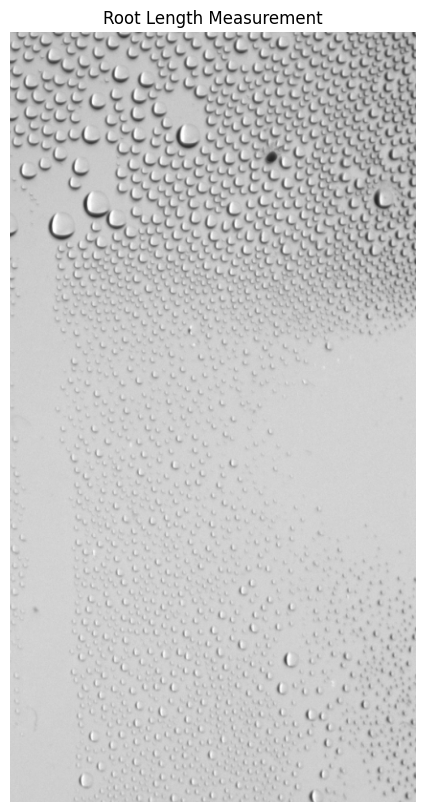

Results saved to root_lengths6.csv


In [ ]:


# List to store the results
results = []

# Process each image and save the results
image = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_6.tif')
petri_dish_6 = find_petri_dish_thresholding(image)

def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[250:1200, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    skeleton = extract_medial_axis(plants_only)
    primary_length, lateral_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_6_plant_{plant_number}", primary_length_rounded])

    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()
# [350:2170, 50:2600]
# Process each plant with the specified thresholds
process_plant(petri_dish_6, 60, 500, 11, 1, results)
process_plant(petri_dish_6, 450, 1000, 162, 2, results)
process_plant(petri_dish_6, 1000, 1500, 165, 3, results)
process_plant(petri_dish_6, 1500, 2000, 160, 4, results)
process_plant(petri_dish_6, 2000, 2500, 160, 5, results)

# Write the results to a CSV file
with open('root_lengths6.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths6.csv")


## ***Image7***

Primary Root Length: 0 pixels


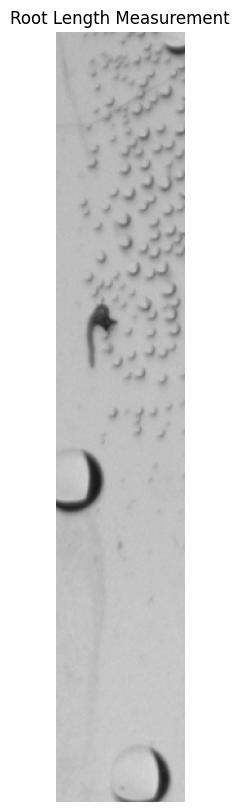

Primary Root Length: 201.05382386916236 pixels


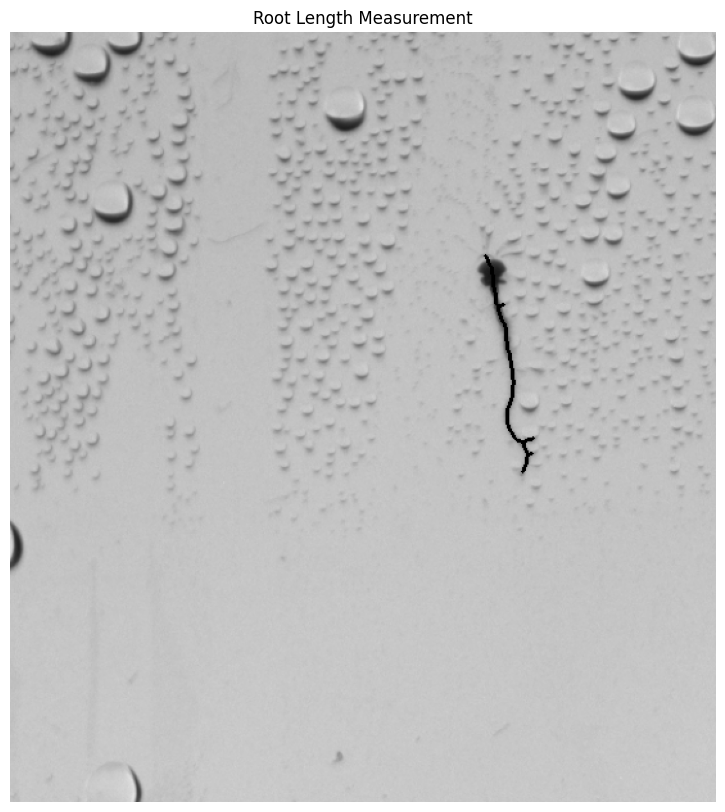

Primary Root Length: 0 pixels


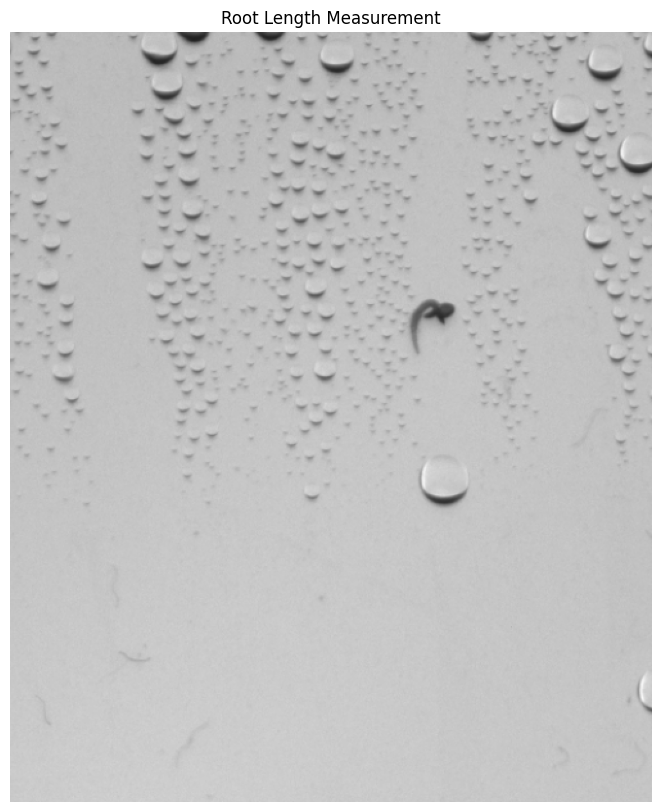

Primary Root Length: 228.74621202458746 pixels


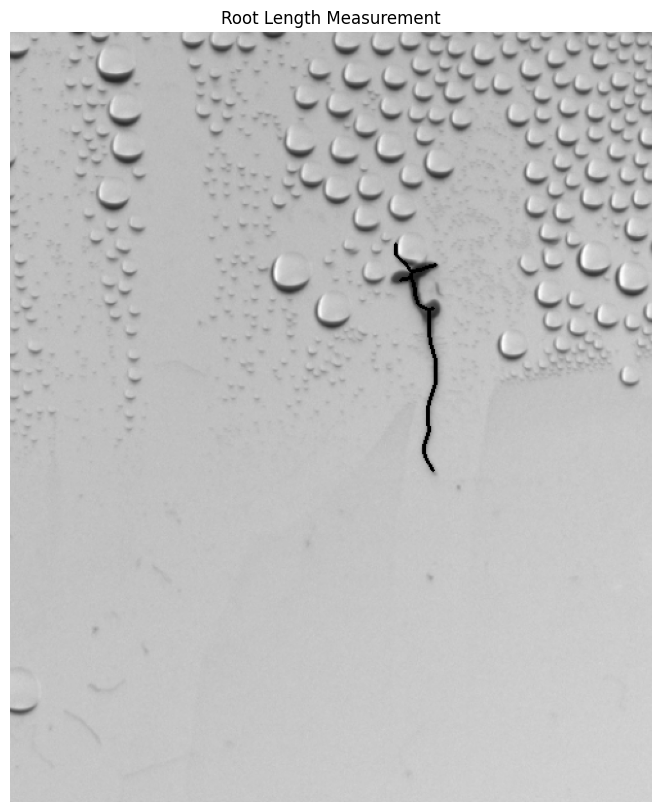

Primary Root Length: 0 pixels


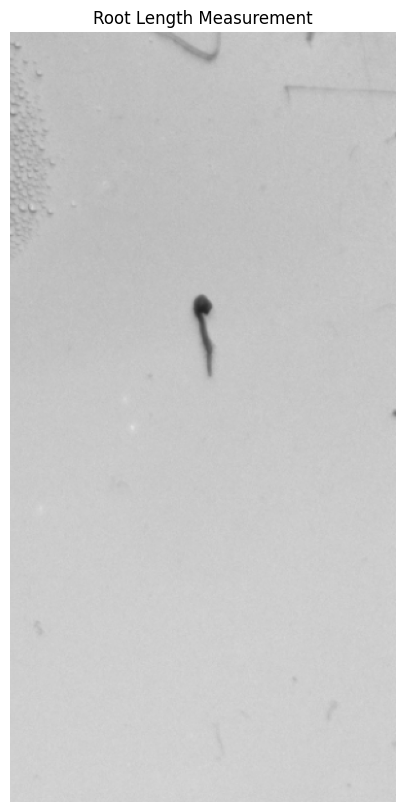

Results saved to root_lengths7.csv


In [ ]:


# List to store the results
results = []

# Process each image and save the results
image = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_7.tif')
petri_dish_7 = find_petri_dish_thresholding(image)

def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[200:800, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    skeleton = extract_medial_axis(plants_only)
    primary_length, lateral_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_7_plant_{plant_number}", primary_length_rounded])

    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()
# [350:2170, 50:2600]
# Process each plant with the specified thresholds
process_plant(petri_dish_7, 300, 400, 160, 1, results)
process_plant(petri_dish_7, 450, 1000, 165, 2, results)
process_plant(petri_dish_7, 1000, 1500, 170, 3, results)
process_plant(petri_dish_7, 1500, 2000, 165, 4, results)
process_plant(petri_dish_7, 2200, 2500, 181, 5, results)

# Write the results to a CSV file
with open('root_lengths7.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths7.csv")


## ***Image8***

Primary Root Length: 433.34419177103416 pixels


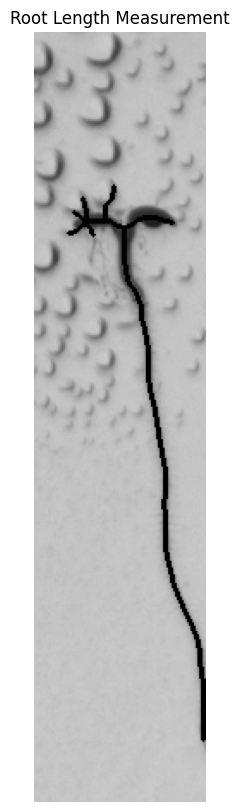

Primary Root Length: 323.0893577750951 pixels


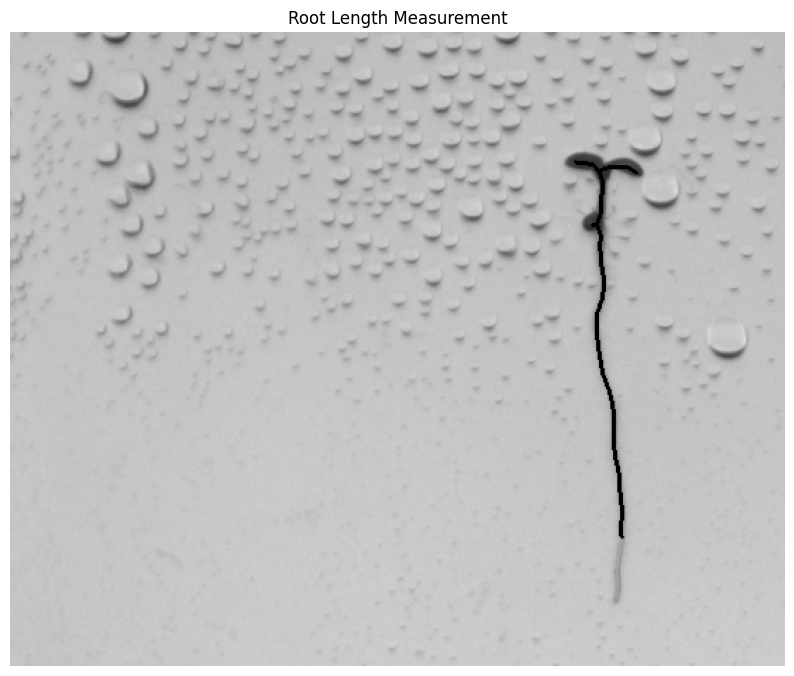

Primary Root Length: 436.00104602052653 pixels


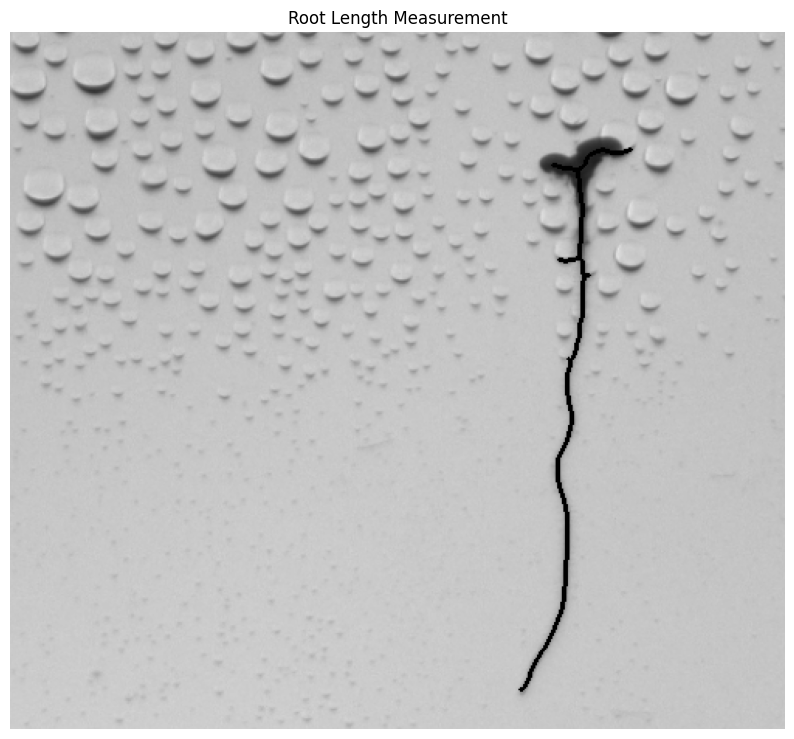

Primary Root Length: 440.48023074035524 pixels


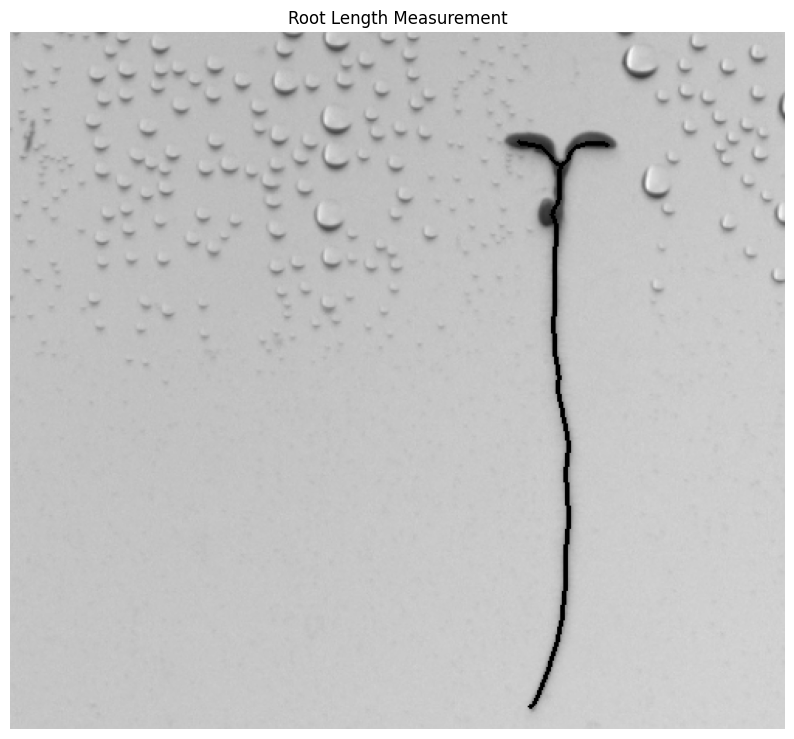

Primary Root Length: 427.072113832392 pixels


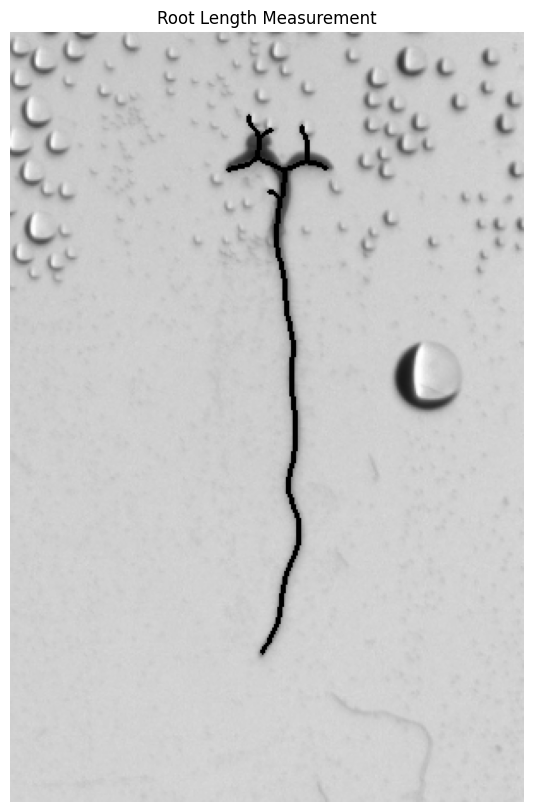

Results saved to root_lengths8.csv


In [ ]:


# List to store the results
results = []

# Process each image and save the results
image = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_8.tif')
petri_dish_8 = find_petri_dish_thresholding(image)

def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:800, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    skeleton = extract_medial_axis(plants_only)
    primary_length, lateral_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_8_plant_{plant_number}", primary_length_rounded])

    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()
# [350:2170, 50:2600]
# Process each plant with the specified thresholds
process_plant(petri_dish_8, 300, 400, 150, 1, results)
process_plant(petri_dish_8, 450, 1000, 165, 2, results)
process_plant(petri_dish_8, 1000, 1500, 170, 3, results)
process_plant(petri_dish_8, 1500, 2000, 165, 4, results)
process_plant(petri_dish_8, 2200, 2500, 181, 5, results)

# Write the results to a CSV file
with open('root_lengths8.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths8.csv")


## ***Image9***

Primary Root Length: 584.5462479183373 pixels


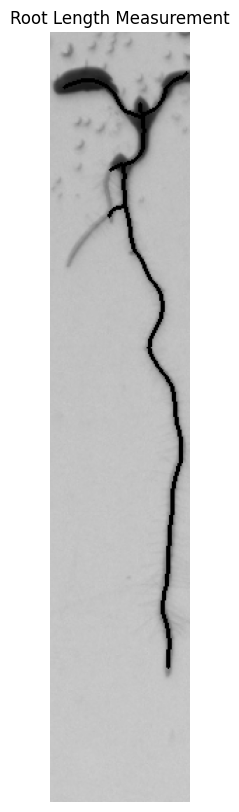

Primary Root Length: 530.1259377015544 pixels


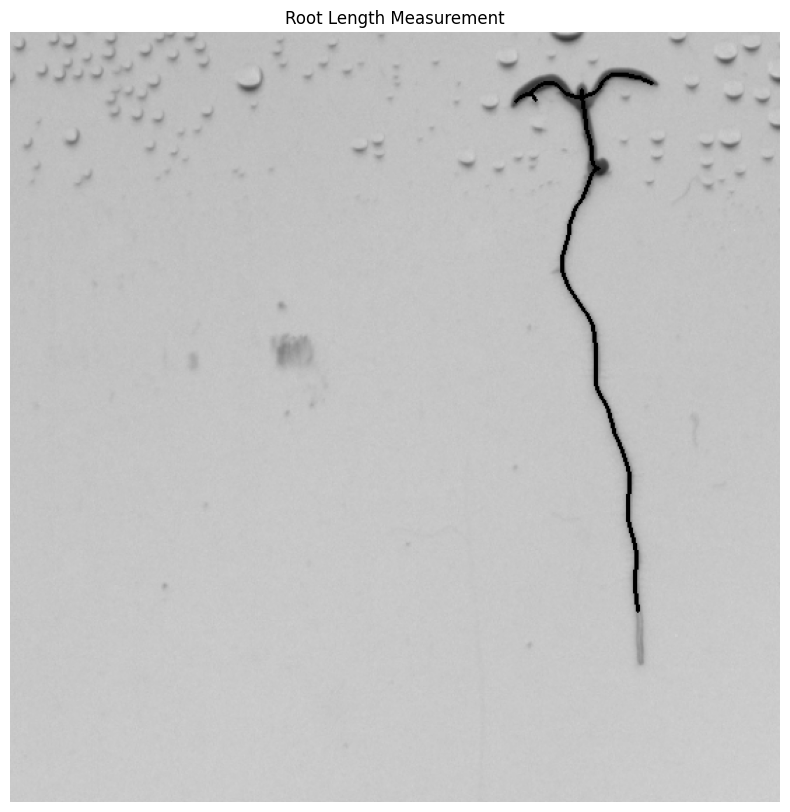

Primary Root Length: 0 pixels


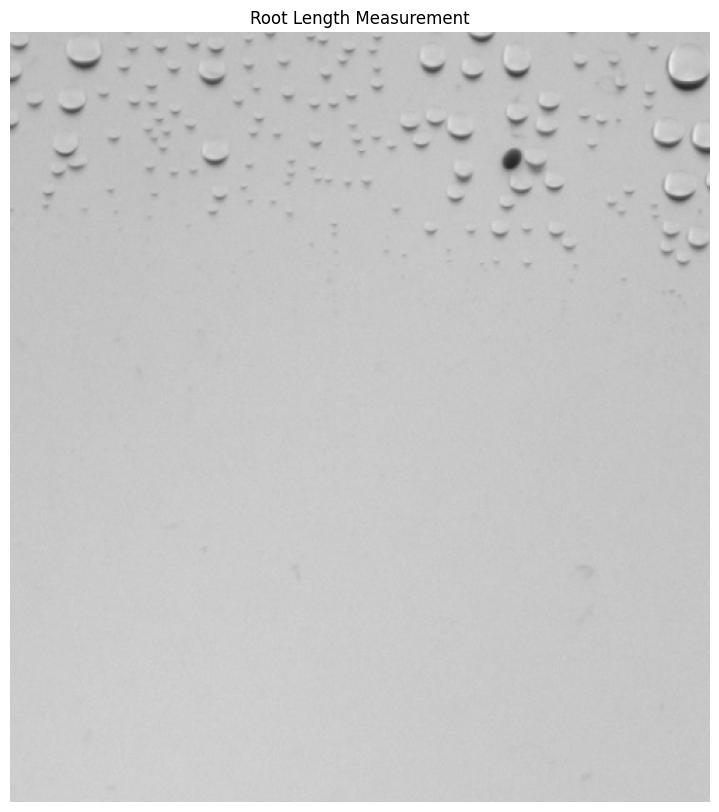

Primary Root Length: 618.0670631985087 pixels


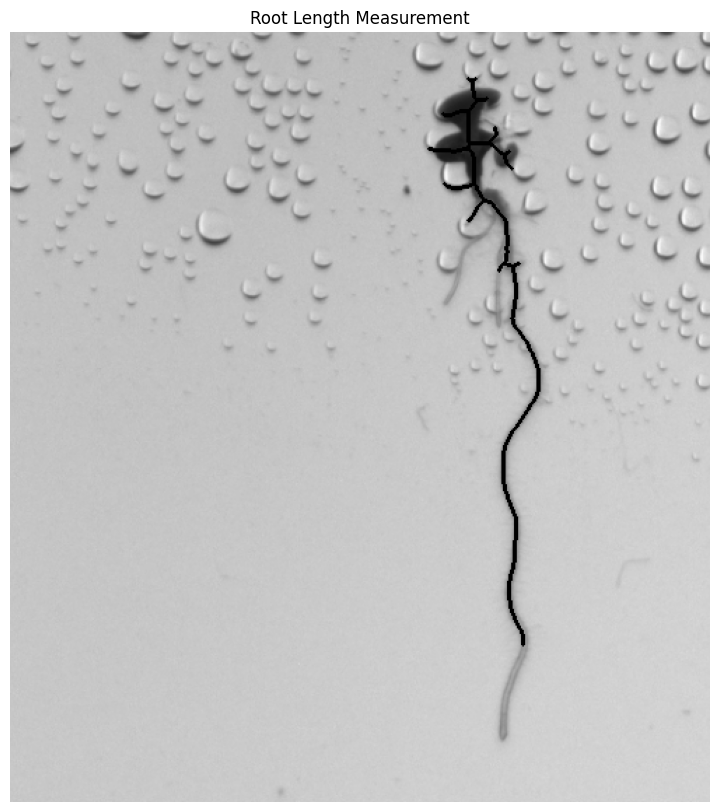

Primary Root Length: 473.01933598375615 pixels


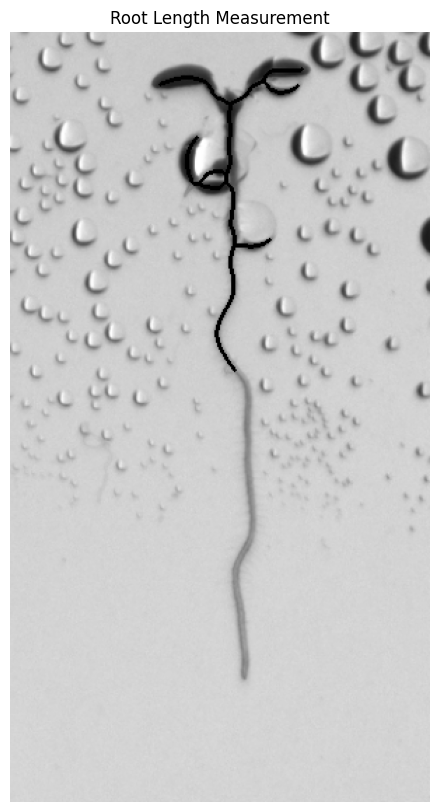

Results saved to root_lengths9.csv


In [ ]:


# List to store the results
results = []

# Process each image and save the results
image = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_9.tif')
petri_dish_9 = find_petri_dish_thresholding(image)

def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:900, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    skeleton = extract_medial_axis(plants_only)
    primary_length, lateral_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_9_plant_{plant_number}", primary_length_rounded])

    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()
# [350:2170, 50:2600]
# Process each plant with the specified thresholds
process_plant(petri_dish_9, 300, 400, 140, 1, results)
process_plant(petri_dish_9, 450, 1000, 160, 2, results)
process_plant(petri_dish_9, 1000, 1500, 170, 3, results)
process_plant(petri_dish_9, 1500, 2000, 155, 4, results)
process_plant(petri_dish_9, 2200, 2500, 155, 5, results)

# Write the results to a CSV file
with open('root_lengths9.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths9.csv")


## ***Image10***

Primary Root Length: 559.6528496361356 pixels


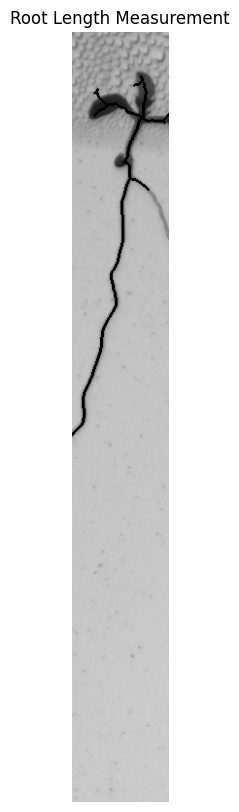

Primary Root Length: 901.3340905032675 pixels


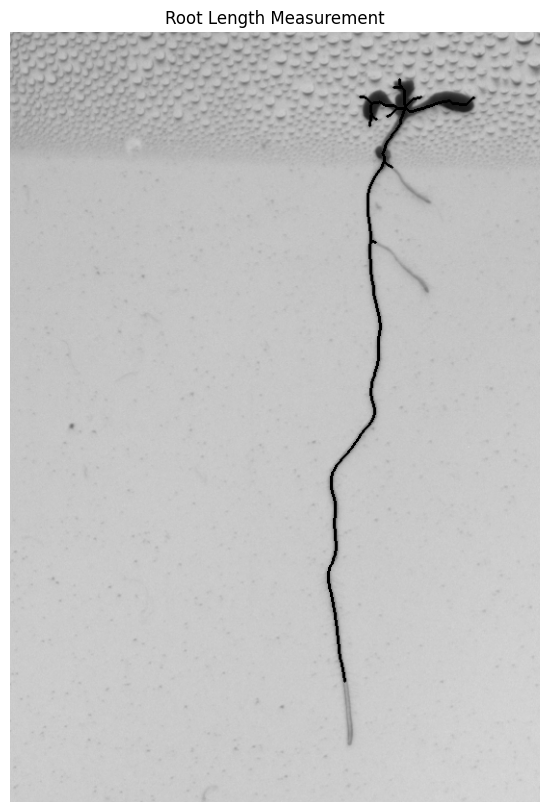

Primary Root Length: 1143.749350086167 pixels


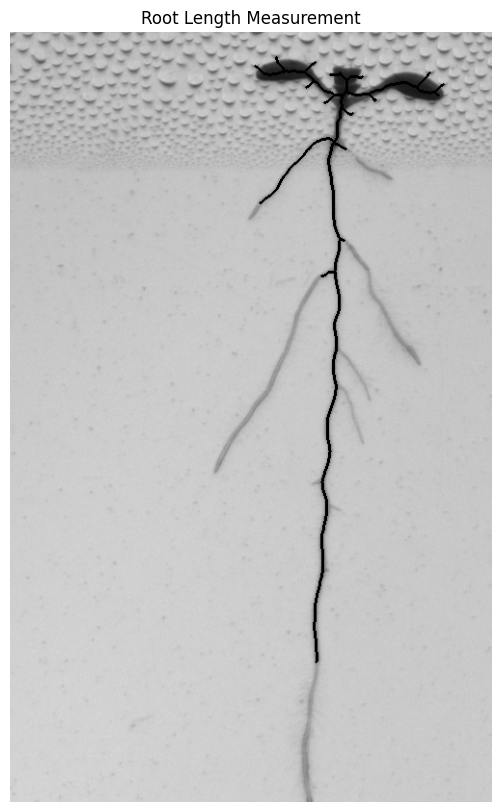

Primary Root Length: 928.1808075912433 pixels


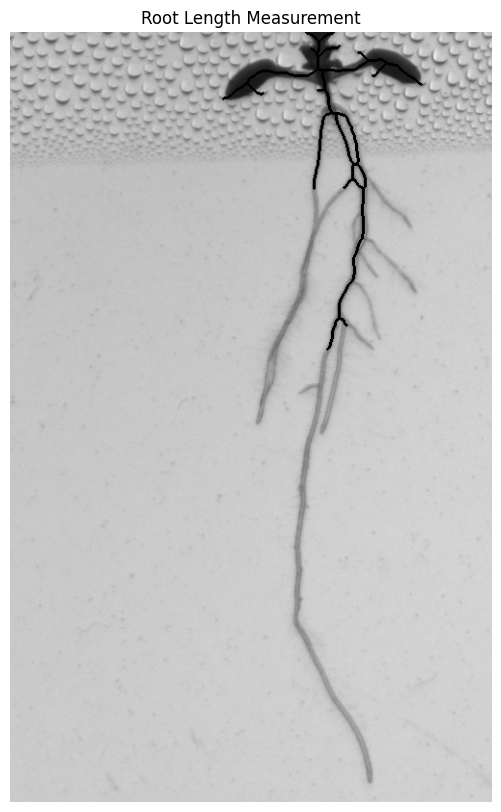

Primary Root Length: 1436.999133448223 pixels


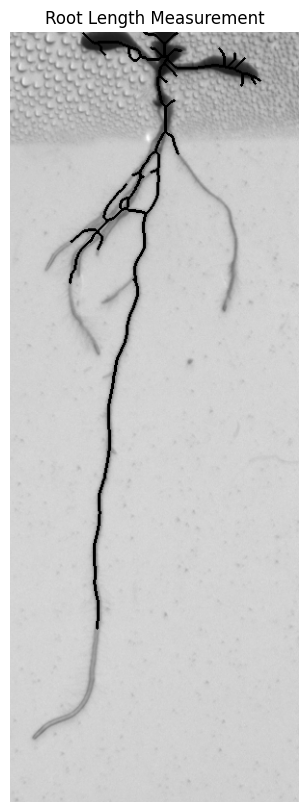

Results saved to root_lengths10.csv


In [ ]:


# List to store the results
results = []

# Process each image and save the results
image = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_10.tif')
petri_dish_10 = find_petri_dish_thresholding(image)

def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:1150, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    skeleton = extract_medial_axis(plants_only)
    primary_length, lateral_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_10_plant_{plant_number}", primary_length_rounded])

    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()
# [350:2170, 50:2600]
# Process each plant with the specified thresholds
process_plant(petri_dish_10, 300, 400, 147, 1, results)
process_plant(petri_dish_10, 450, 1000, 160, 2, results)
process_plant(petri_dish_10, 1000, 1500, 155, 3, results)
process_plant(petri_dish_10, 1500, 2000, 145, 4, results)
process_plant(petri_dish_10, 2200, 2500, 158, 5, results)

# Write the results to a CSV file
with open('root_lengths10.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths10.csv")


## ***Image11***

<function matplotlib.pyplot.show(close=None, block=None)>

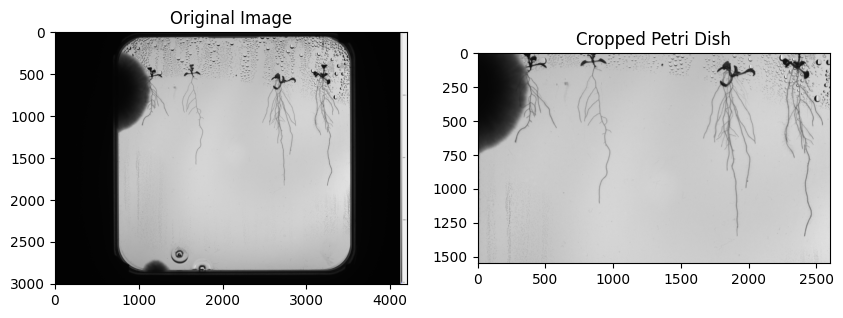

In [ ]:
def find_petri_dish_thresholding(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    petri_dish_contour = None
    min_contour_area = 4000
    for contour in contours:
        if cv2.contourArea(contour) > min_contour_area:
            petri_dish_contour = contour
            break
    x, y, w, h = cv2.boundingRect(petri_dish_contour)
    side_length = max(w, h)
    x_center, y_center = x + w // 2, y + h // 2
    petri_dish = image[y:y + h, x:x + w]
    petri_dish = cv2.resize(petri_dish, (2670, 2670))
    petri_dish_gray = cv2.cvtColor(petri_dish, cv2.COLOR_BGR2GRAY)
    return petri_dish_gray

# Read the image
image = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_11.tif')
petri_dish_1 = find_petri_dish_thresholding(image)
plants_1_cropped = petri_dish_1[350:1900, 0:2600]
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(plants_1_cropped, cv2.COLOR_BGR2RGB))
plt.title("Cropped Petri Dish")
plt.show

Primary Root Length: 2047.7047609329943 pixels


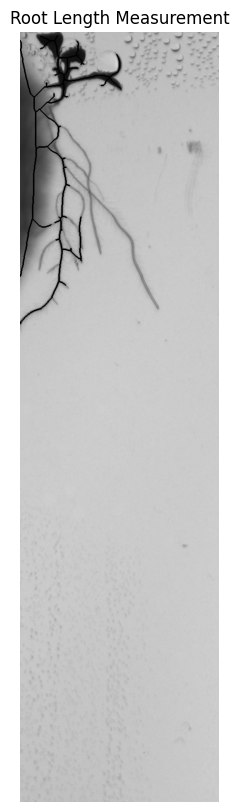

Primary Root Length: 1180.7138161802345 pixels


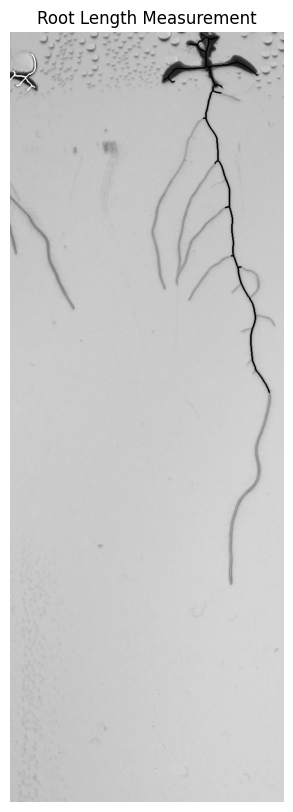

Primary Root Length: 0 pixels


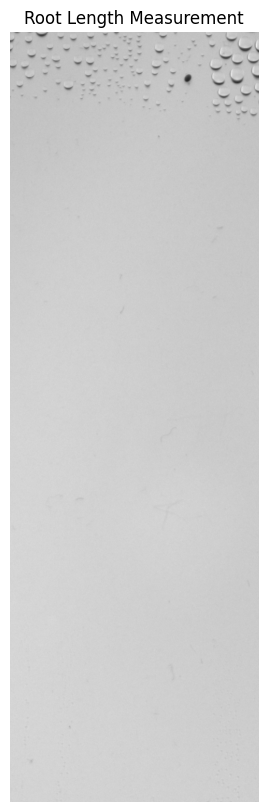

Primary Root Length: 1704.2489168102784 pixels


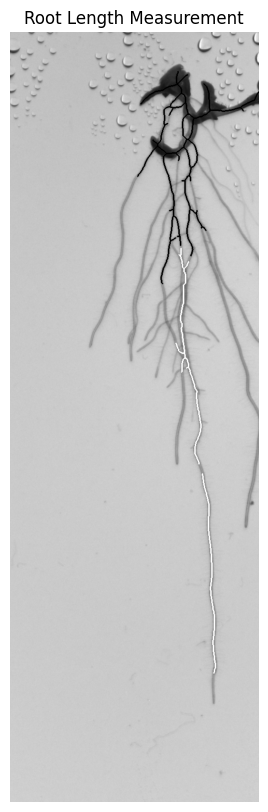

Primary Root Length: 2101.3920984545357 pixels


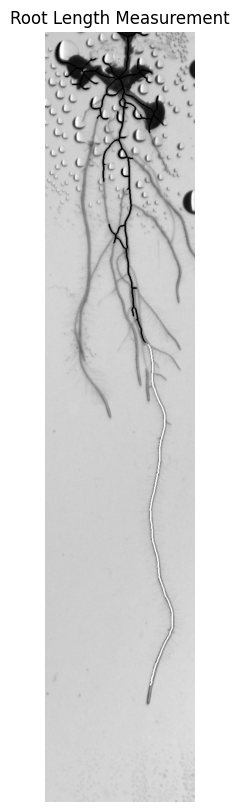

Results saved to root_lengths11.csv


In [ ]:


# List to store the results
results = []

# Process each image and save the results
image = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_11.tif')
petri_dish_11 = find_petri_dish_thresholding(image)

def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:1900, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    skeleton = extract_medial_axis(plants_only)
    primary_length, lateral_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_11_plant_{plant_number}", primary_length_rounded])

    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()
# [350:2170, 50:2600]
# Process each plant with the specified thresholds
process_plant(petri_dish_11, 300, 700, 140, 1, results)
process_plant(petri_dish_11, 450, 1000, 160, 2, results)
process_plant(petri_dish_11, 1000, 1500, 155, 3, results)
process_plant(petri_dish_11, 1500, 2000, 150, 4, results)
process_plant(petri_dish_11, 2200, 2500, 145, 5, results)

# Write the results to a CSV file
with open('root_lengths11.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths11.csv")


### ***Combine the csv files***

In [ ]:
import pandas as pd

# Read the two CSV files
df1 = pd.read_csv('/content/root_lengths.csv')
df2 = pd.read_csv('/content/root_lengths2.csv')
df3 = pd.read_csv('/content/root_lengths3.csv')
df4 = pd.read_csv('/content/root_lengths4.csv')
df5 = pd.read_csv('/content/root_lengths5.csv')
df6 = pd.read_csv('/content/root_lengths6.csv')
df7 = pd.read_csv('/content/root_lengths7.csv')
df8 = pd.read_csv('/content/root_lengths8.csv')
df9 = pd.read_csv('/content/root_lengths9.csv')
df10 = pd.read_csv('/content/root_lengths10.csv')
df11 = pd.read_csv('/content/root_lengths11.csv')
# Combine the dataframes
combined_df = pd.concat([df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11], ignore_index=True)

# Save the combined dataframe to a new CSV file
combined_df.to_csv('_root_lengths.csv', index=False)

print("Combined CSV saved as '_root_lengths.csv'")

Combined CSV saved as '_root_lengths.csv'
